# ***Messages***

In [18]:
positive_message = "You are a possible covid suspect. Kindly take precautionary measures until you are verified by an expert."
negative_message = "You are tested as covid negative. Kindly take preventive measures and consult a doctor forfurther verification."
file_num = 1
common_path="/content/drive/MyDrive/Synthetic Data/SyntheticData  ("

## ***Mounting Drive***

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# ***Required packages***

In [19]:
pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# ***CT Scan***

In [20]:
from tensorflow import keras
model_CT_Scan = keras.models.load_model('/content/drive/MyDrive/Model Saves/Resnet101 CT-Scan')  #***************************change variable name accordingly

import tensorflow as tf
import numpy as np
correct, correct_cov, correct_non, total_cov, total_non = 0, 0, 0, 0, 0
output= []

CT_scan_prediction = []

for file_num in range(1, 11):
  current_path_ct=common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_ctscan.png"
  # Open an image file
  try:
    img = tf.keras.preprocessing.image.load_img(current_path_ct, target_size=(128, 128))
  except:
    try:
      current_path_ct=common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_ctscan.jpeg"
      img = tf.keras.preprocessing.image.load_img(current_path_ct, target_size=(128, 128))
    except:
      current_path_ct=common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_ctscan.jpg"
      img = tf.keras.preprocessing.image.load_img(current_path_ct, target_size=(128, 128))
    

  # Convert the image to a numpy array
  img_array = tf.keras.preprocessing.image.img_to_array(img)

  # Add an extra dimension to the image (since VGG16 expects a 4D input)
  img_array = np.expand_dims(img_array, axis=0)

  # Preprocess the image (subtracting the mean RGB value)
  img_array = tf.keras.applications.resnet_v2.preprocess_input(img_array)

  # Use the model to classify the image
  predictions = model_CT_Scan.predict(img_array)                                       #********************change model name here as well

  if float(format(predictions[0][0]+predictions[0][1], '.2f')) > float(format(predictions[0][2], '.2f')):
    CT_scan_prediction.append(1)  #assuming covid = 1           ************************** use list according to the name of the dataset.. see in cell 1
  else:
    CT_scan_prediction.append(0) #assuming non-covid = 0            ************************** use list according to the name of the dataset.. see in cell 1  

print(CT_scan_prediction)

1/1 [==============================] - 0s 28ms/step
[1, 1, 1, 1, 0, 0, 1, 1, 1, 1]


# ***X-ray***

In [21]:
from tensorflow import keras
Xray_model = keras.models.load_model('/content/drive/MyDrive/Model Saves/VGG16 Xray')
xray_predict = []

xray_prediction = []
import tensorflow as tf
import numpy as np

import cv2
# common_path="/content/drive/MyDrive/Collected Data/Sample  ("
#current image path
for file_num in range(1,11):
  current_path=common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_xray.jpeg"
  img=None
  try: 
    img = tf.keras.preprocessing.image.load_img(current_path, target_size=(150, 150))
    
  except:
    try:
      current_path=common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_xray.png"
      img = tf.keras.preprocessing.image.load_img(current_path, target_size=(150, 150))
    except:
      current_path=common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_xray.jpg"
      img = tf.keras.preprocessing.image.load_img(current_path, target_size=(150, 150))

  # Open an image file
  # Convert the image to a numpy array
  img_array = tf.keras.preprocessing.image.img_to_array(img)
  # Add an extra dimension to the image (since VGG16 expects a 4D input)
  img_array = np.expand_dims(img_array, axis=0)
  # Preprocess the image (subtracting the mean RGB value)
  img_array = tf.keras.applications.resnet_v2.preprocess_input(img_array)
  # Use the model to classify the image
  predictions = Xray_model.predict(img_array)

  if float(format(predictions[0][0], '.2f')) > float(format(predictions[0][1], '.2f')):
    xray_prediction.append(1)
  else:
    xray_prediction.append(0)
  
print(xray_prediction)

1/1 [==============================] - 0s 25ms/step
[1, 1, 1, 0, 1, 0, 0, 1, 1, 1]


# ***Heavy cough***

In [22]:
from tensorflow import keras
from pydub import AudioSegment
import numpy as np
from matplotlib import pyplot as plt
import scipy.io.wavfile as wav
from numpy.lib import stride_tricks

""" short time fourier transform of audio signal """
def stft(sig, frameSize, overlapFac=0.5, window=np.hanning):
    win = window(frameSize)
    hopSize = int(frameSize - np.floor(overlapFac * frameSize))   
    samples = np.append(np.zeros(int(np.floor(frameSize/2.0))), sig)    
    cols = np.ceil( (len(samples) - frameSize) / float(hopSize)) + 1
    samples = np.append(samples, np.zeros(frameSize))
    frames = stride_tricks.as_strided(samples, shape=(int(cols), frameSize), strides=(samples.strides[0]*hopSize, samples.strides[0])).copy()
    frames *= win
    return np.fft.rfft(frames)    

""" scale frequency axis logarithmically """    
def logscale_spec(spec, sr=44100, factor=20.):
    timebins, freqbins = np.shape(spec)

    scale = np.linspace(0, 1, freqbins) ** factor
    scale *= (freqbins-1)/max(scale)
    scale = np.unique(np.round(scale))

    newspec = np.complex128(np.zeros([timebins, len(scale)]))
    for i in range(0, len(scale)):        
        if i == len(scale)-1:
            newspec[:,i] = np.sum(spec[:,int(scale[i]):], axis=1)
        else:        
            newspec[:,i] = np.sum(spec[:,int(scale[i]):int(scale[i+1])], axis=1)

    allfreqs = np.abs(np.fft.fftfreq(freqbins*2, 1./sr)[:freqbins+1])
    freqs = []
    for i in range(0, len(scale)):
        if i == len(scale)-1:
            freqs += [np.mean(allfreqs[int(scale[i]):])]
        else:
            freqs += [np.mean(allfreqs[int(scale[i]):int(scale[i+1])])]
    return newspec, freqs

""" plot spectrogram"""
def plotstft(audiopath, binsize=2**10, plotpath=None, colormap="jet"):
    samplerate, samples = wav.read(audiopath)
    s = stft(samples, binsize)
    sshow, freq = logscale_spec(s, factor=1.0, sr=samplerate)
    ims = 20.*np.log10(np.abs(sshow)/10e-6) # amplitude to decibel
    return ims
def plot_save_return_address(path_to_get, sample_num):
  ims = plotstft(path_to_get)
  plt.figure(figsize=(15, 7.5))
  plt.imshow(np.transpose(ims), origin="lower", aspect="auto", cmap="jet", interpolation="none")
  plt.axis("off")

  plotpath ='/content/'+"SyntheticData"+str(sample_num)+"_caugh_spectrogram.png"
  plt.savefig(plotpath, bbox_inches="tight")
  return plotpath

In [23]:
Heavy_Cough_model = keras.models.load_model('/content/drive/MyDrive/Model Saves/VGG16 Heavy Cough')

<ipython-input-22-c071f280f714>:48: RuntimeWarning: divide by zero encountered in log10
  ims = 20.*np.log10(np.abs(sshow)/10e-6) # amplitude to decibel


1/1 [==============================] - 0s 19ms/step
[1, 0, 1, 0, 1, 1, 1, 1, 0, 0]


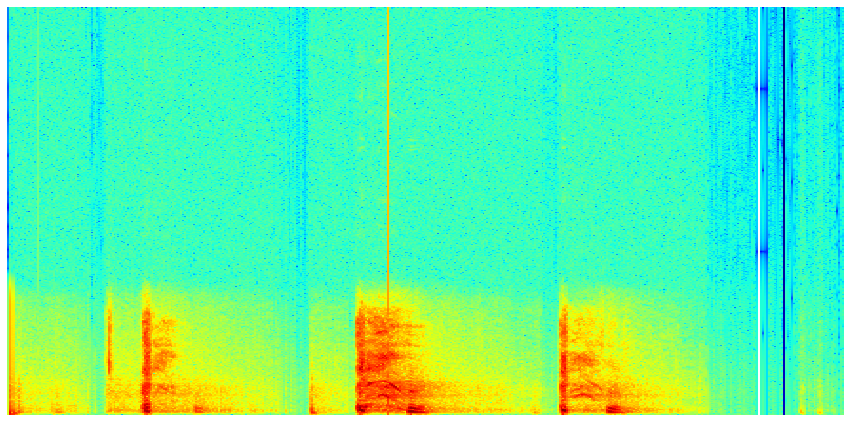

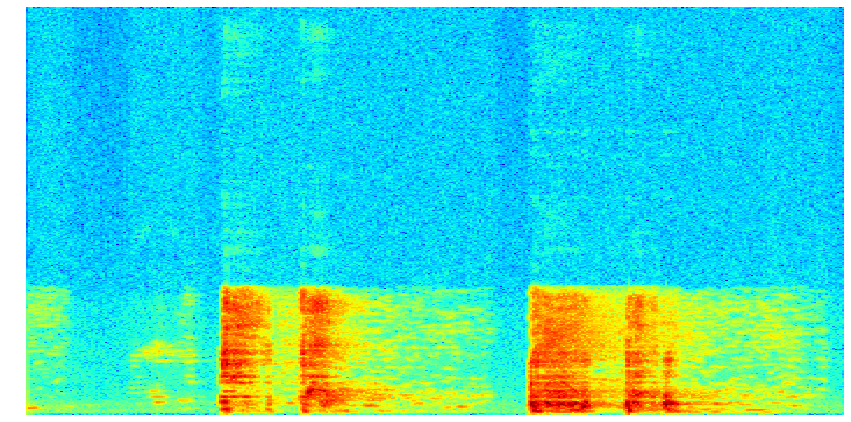

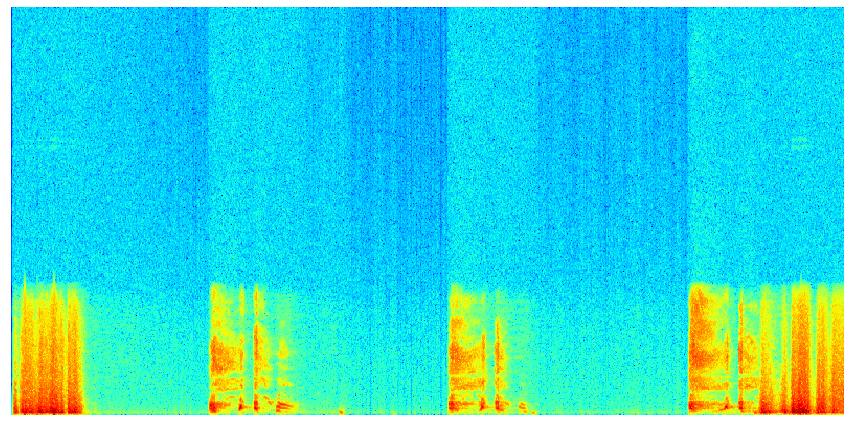

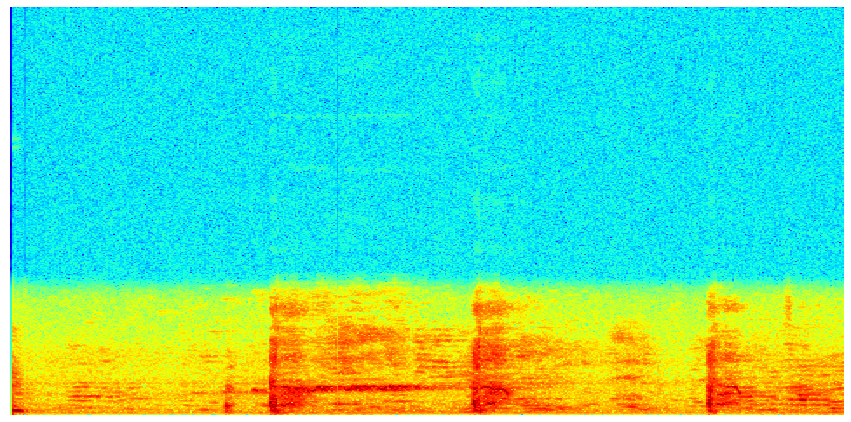

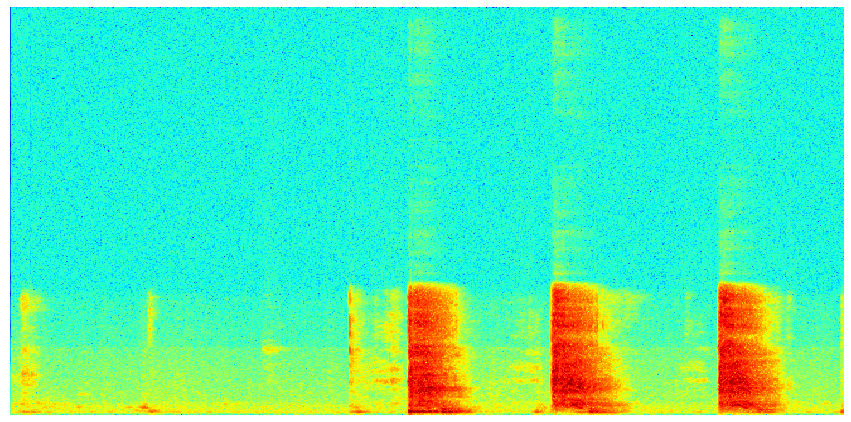

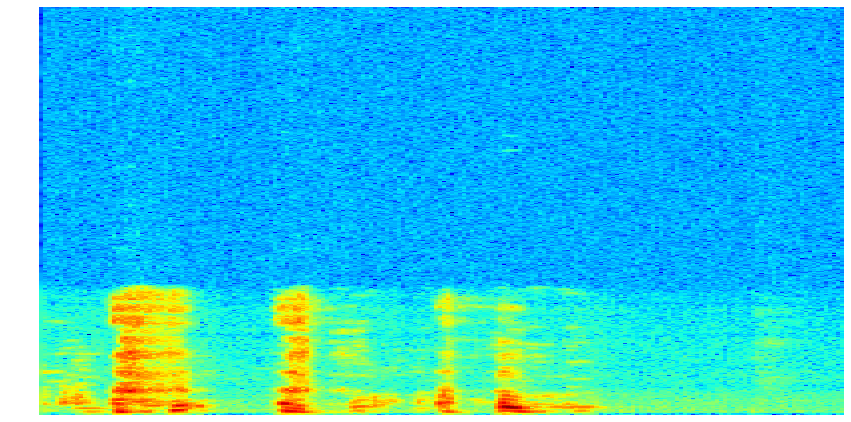

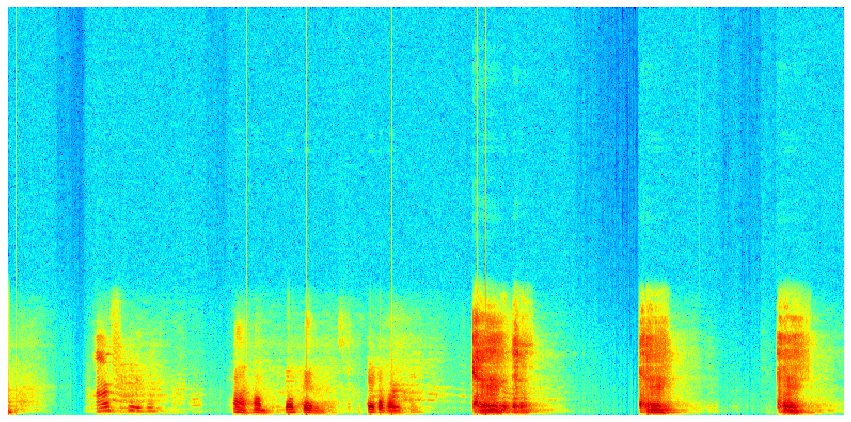

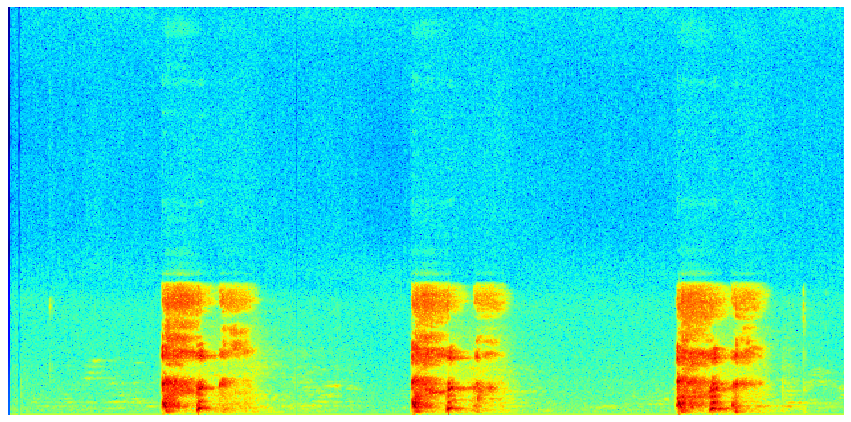

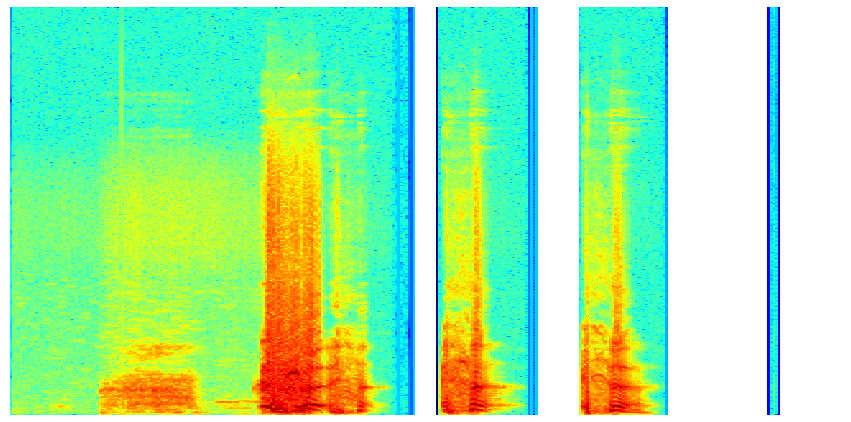

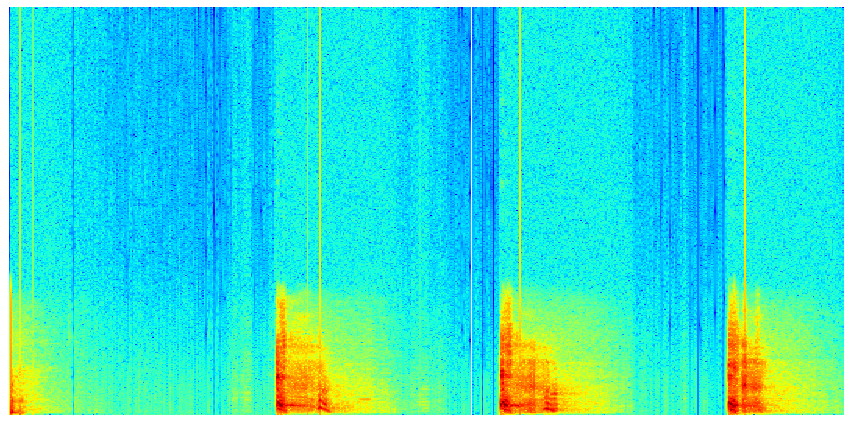

In [24]:
cough_prediction = []
correct, correct_cov, correct_non, total_cov, total_non = 0, 0, 0, 0, 0
output= []

for file_num in range(1, 11):
  # Open an image file
  # current_mp3_path_cough=common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_cough.wav"
  # wav_file_path_cough = '/content/'+"SyntheticData"+str(file_num)+"_cough.wav"
  wav_file_path_cough = common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_cough.wav"
  # reading the .mp3 audio file exporting to .wav format
  AudioSegment.from_mp3(wav_file_path_cough).export(wav_file_path_cough, format="wav")

  spectrogram_file_path= plot_save_return_address(wav_file_path_cough, file_num)

  img = tf.keras.preprocessing.image.load_img(spectrogram_file_path, target_size=(224,224))

  # Open an image file
  # Convert the image to a numpy array
  img_array = tf.keras.preprocessing.image.img_to_array(img)
  # Add an extra dimension to the image (since VGG16 expects a 4D input)
  img_array = np.expand_dims(img_array, axis=0)
  # Preprocess the image (subtracting the mean RGB value)
  img_array = tf.keras.applications.vgg16.preprocess_input(img_array)
  # Use the model to classify the image
  predictions = Heavy_Cough_model.predict(img_array)

  if float(format(predictions[0][0]+predictions[0][2], '.2f')) > float(format(predictions[0][1], '.2f')):
    cough_prediction.append(1)
  else:
    cough_prediction.append(0)

print(cough_prediction)


# ***Deep Breathing***

In [25]:
from tensorflow import keras
from pydub import AudioSegment
import numpy as np
from matplotlib import pyplot as plt
import scipy.io.wavfile as wav
from numpy.lib import stride_tricks

""" short time fourier transform of audio signal """
def stft(sig, frameSize, overlapFac=0.5, window=np.hanning):
    win = window(frameSize)
    hopSize = int(frameSize - np.floor(overlapFac * frameSize))   
    samples = np.append(np.zeros(int(np.floor(frameSize/2.0))), sig)    
    cols = np.ceil( (len(samples) - frameSize) / float(hopSize)) + 1
    samples = np.append(samples, np.zeros(frameSize))
    frames = stride_tricks.as_strided(samples, shape=(int(cols), frameSize), strides=(samples.strides[0]*hopSize, samples.strides[0])).copy()
    frames *= win
    return np.fft.rfft(frames)    

""" scale frequency axis logarithmically """    
def logscale_spec(spec, sr=44100, factor=20.):
    timebins, freqbins = np.shape(spec)

    scale = np.linspace(0, 1, freqbins) ** factor
    scale *= (freqbins-1)/max(scale)
    scale = np.unique(np.round(scale))

    newspec = np.complex128(np.zeros([timebins, len(scale)]))
    for i in range(0, len(scale)):        
        if i == len(scale)-1:
            newspec[:,i] = np.sum(spec[:,int(scale[i]):], axis=1)
        else:        
            newspec[:,i] = np.sum(spec[:,int(scale[i]):int(scale[i+1])], axis=1)

    allfreqs = np.abs(np.fft.fftfreq(freqbins*2, 1./sr)[:freqbins+1])
    freqs = []
    for i in range(0, len(scale)):
        if i == len(scale)-1:
            freqs += [np.mean(allfreqs[int(scale[i]):])]
        else:
            freqs += [np.mean(allfreqs[int(scale[i]):int(scale[i+1])])]
    return newspec, freqs

""" plot spectrogram"""
def plotstft(audiopath, binsize=2**10, plotpath=None, colormap="jet"):
    samplerate, samples = wav.read(audiopath)
    s = stft(samples, binsize)
    sshow, freq = logscale_spec(s, factor=1.0, sr=samplerate)
    ims = 20.*np.log10(np.abs(sshow)/10e-6) # amplitude to decibel
    return ims
def plot_save_return_address(path_to_get, sample_num):
  ims = plotstft(path_to_get)
  plt.figure(figsize=(15, 7.5))
  plt.imshow(np.transpose(ims), origin="lower", aspect="auto", cmap="jet", interpolation="none")
  plt.axis("off")

  plotpath ='/content/'+"SyntheticData"+str(sample_num)+"_breath_spectrogram.png"
  plt.savefig(plotpath, bbox_inches="tight")
  return plotpath

In [26]:
Deep_Breath_model = keras.models.load_model('/content/drive/MyDrive/Model Saves/Resnet50 Deep Breath')

<ipython-input-25-76fecde2d846>:48: RuntimeWarning: divide by zero encountered in log10
  ims = 20.*np.log10(np.abs(sshow)/10e-6) # amplitude to decibel


1/1 [==============================] - 0s 25ms/step
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


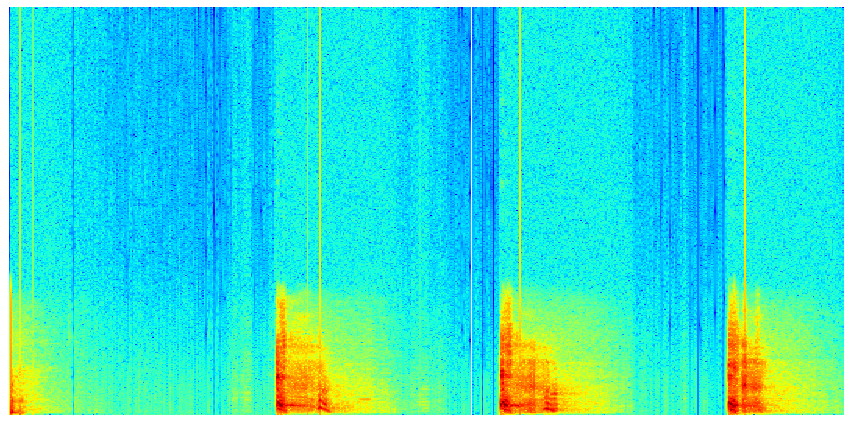

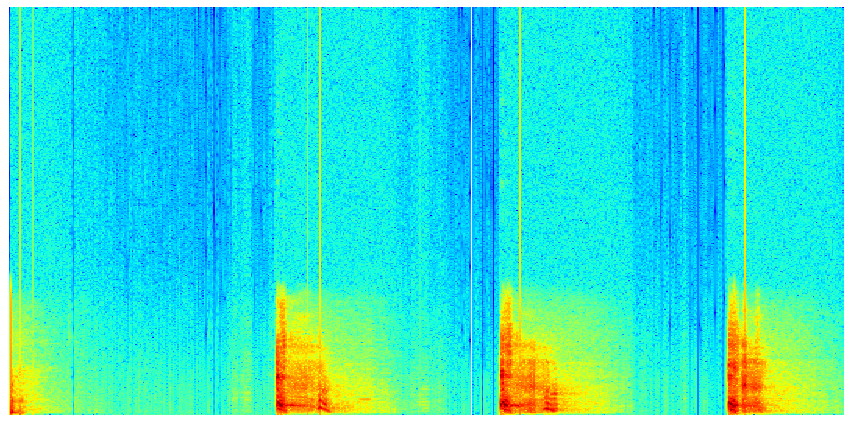

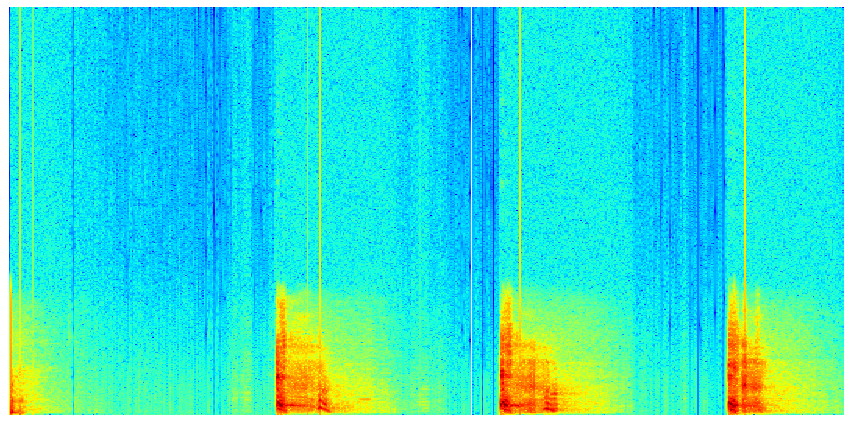

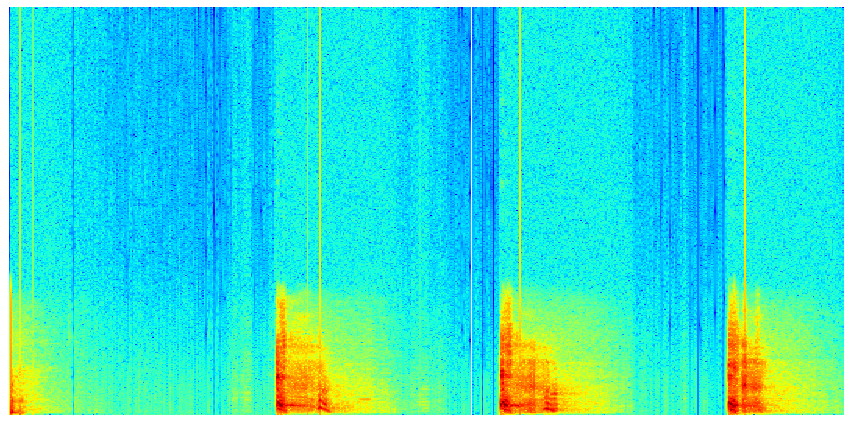

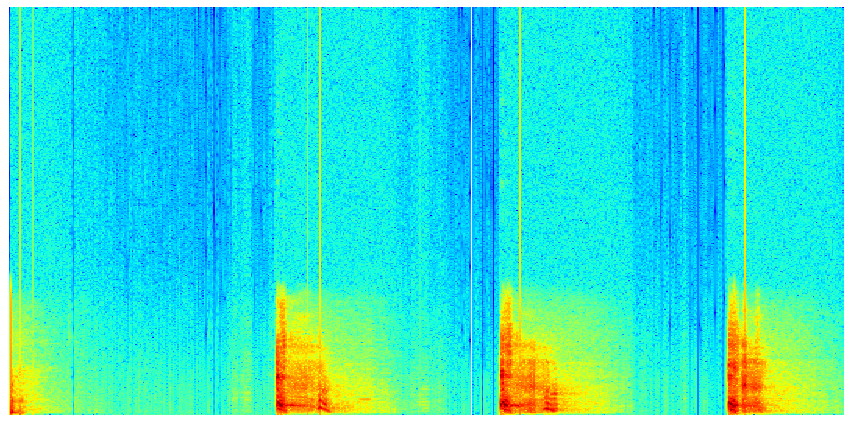

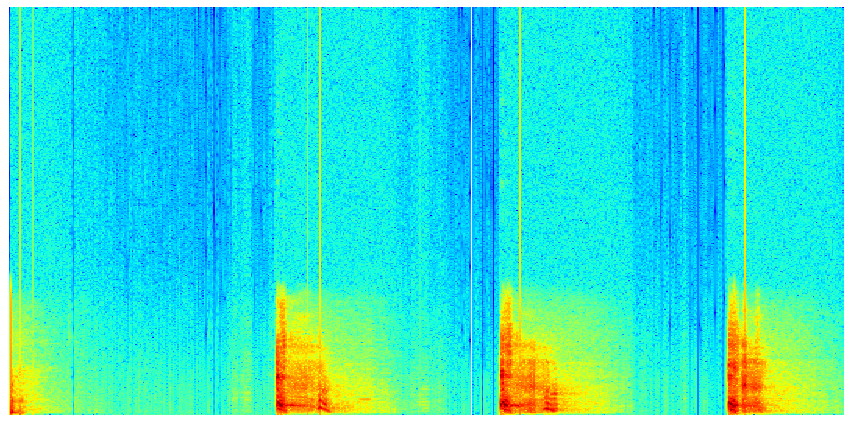

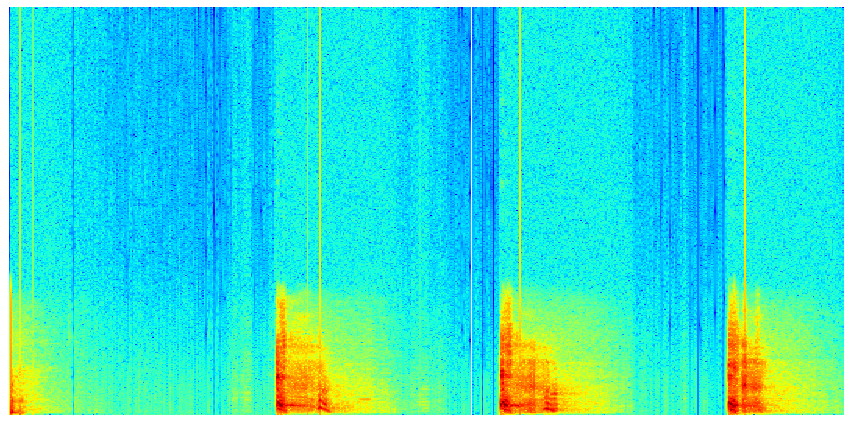

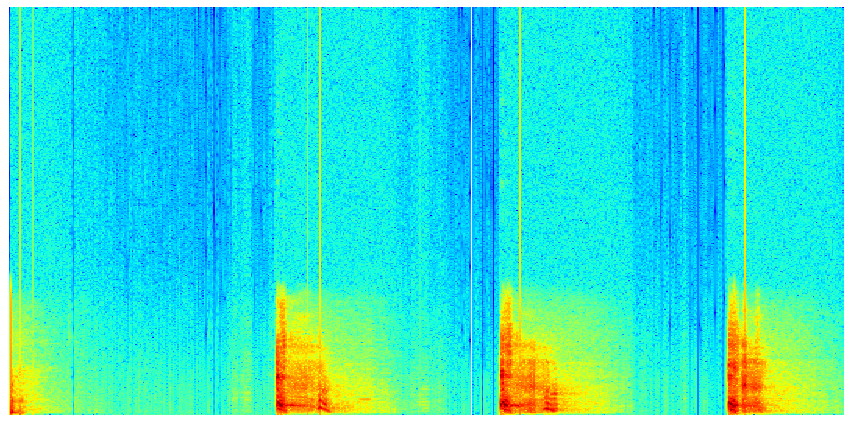

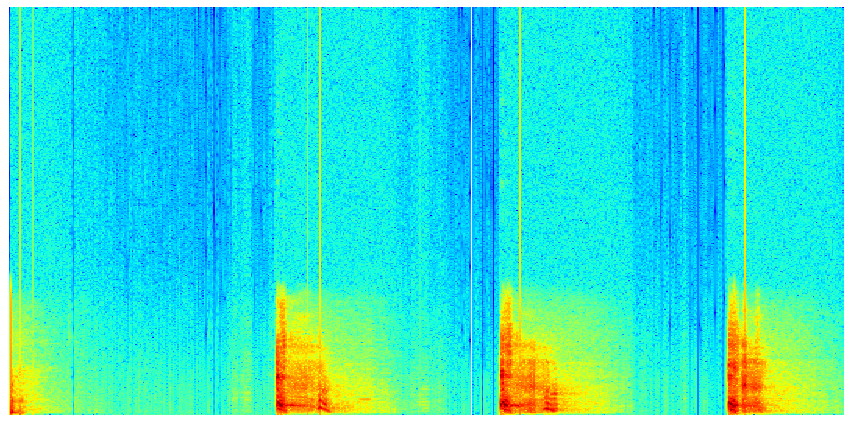

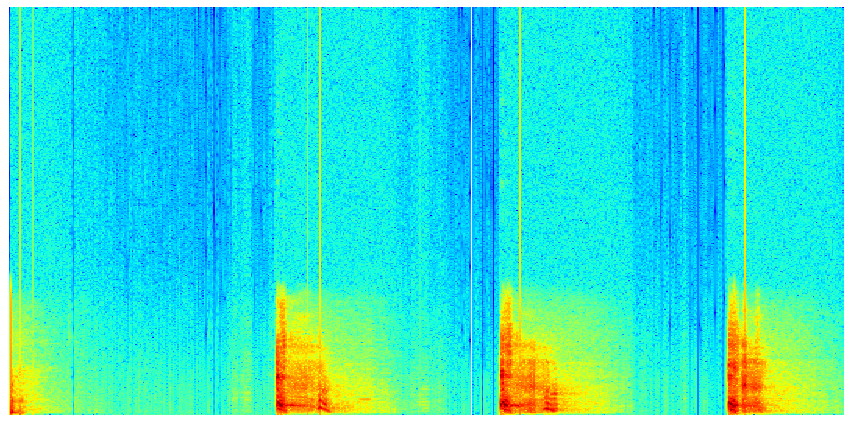

In [27]:
deep_breath_prediction = []

for file_num in range(1, 11):  
  # # output file location
  # current_mp3_path_breath=common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_breath.mp3"

  # #convert mp3 to wav
  # wav_file_path_breath = '/content/'+"SyntheticData"+str(file_num)+"_breath.wav"

  wav_file_path_breath = common_path+str(file_num)+")/SyntheticData"+str(file_num)+"_breath.wav"

  # reading the .mp3 audio file exporting to .wav format
  AudioSegment.from_mp3(wav_file_path_cough).export(wav_file_path_breath, format="wav")

  spectrogram_file_path= plot_save_return_address(wav_file_path_breath, file_num)

  img = tf.keras.preprocessing.image.load_img(spectrogram_file_path, target_size=(224,224))

  # Open an image file
  # Convert the image to a numpy array
  img_array = tf.keras.preprocessing.image.img_to_array(img)
  # Add an extra dimension to the image (since VGG16 expects a 4D input)
  img_array = np.expand_dims(img_array, axis=0)
  # Preprocess the image (subtracting the mean RGB value)
  img_array = tf.keras.applications.resnet50.preprocess_input(img_array)
  # Use the model to classify the image
  predictions =Deep_Breath_model.predict(img_array)

  if float(format(predictions[0][1], '.2f')) < 0.96:
    deep_breath_prediction.append(1)
  else:
    deep_breath_prediction.append(0)

print(deep_breath_prediction)

# ***Final Result***

# ***4 parameters- CTScan, X-ray, Heavy Cough Sound, Breathing sound***

In [28]:
CT_scan_weight_4para = 0.39236546838661474 
X_ray_weight_4para = 0.292364637070311 
cough_weight_4para = 0.23368775878226913 
breath_weight_4para = 0.08158213576080497
threshold_4para = CT_scan_weight_4para

actual_result = [1,1,1,1,0,0,0,1,1,1]

four_parameter_predict=[]

correct_pos = 0
correct_neg = 0
false_pos = 0
false_neg = 0

for i in range(0, 10):
  severity = "N/A"
  perform_test = "N/A"
  self_isolation = "N/A"
  doctor_consultation = "N/A"

  final_result_4para = CT_scan_weight_4para * CT_scan_prediction[i] + X_ray_weight_4para * xray_prediction[i] + cough_weight_4para * cough_prediction[i] + breath_weight_4para *  deep_breath_prediction[i]

  if final_result_4para >= threshold_4para:
    four_parameter_predict.append(1)
    # print("POSITIVE")
    # print(positive_message)
    perform_test = "PCR"
    self_isolation = "Yes"
    doctor_consultation = "Yes" 

    if CT_scan_prediction[i] == 1:
      if xray_prediction[i] == 1:
        severity = "Definite"
      else:
        severity = "Very Significant"
    else:
      if xray_prediction[i] == 1: 
        
        if cough_prediction[i] == 0 and deep_breath_prediction[i] == 0:
          severity = "Significant"
        else:
          severity = "Very Significant"
  else:
    four_parameter_predict.append(0)
    # print("NEGATIVE")
    
    # print(negative_message)
    perform_test = "Antigen"
    doctor_consultation = "Yes (Followup Needed)" 
    if cough_prediction[i] == 1 and deep_breath_prediction[i] == 1:
      severity="Very Suspicious"
    elif (cough_prediction[i] == 1 and deep_breath_prediction[i] == 0) or (cough_prediction[i] == 0 and deep_breath_prediction[i] == 1):
      severity="Suspicious"
    else:
      severity="Definite"
      doctor_consultation = "N/A"
      perform_test = "N/A"

  # print("Synthetic data", i)
  # print("Severity :", severity)
  # print("Recommended Test:", perform_test)
  # print("Self Isolation:", self_isolation)
  # print("Doctor Consultation :", doctor_consultation)

for i in range(0, 10):
  if actual_result[i] == four_parameter_predict[i]:
    if four_parameter_predict[i] == 0:
      correct_neg += 1
    else:
      correct_pos += 1
  else:
    if four_parameter_predict[i] == 0:
      false_neg += 1
    else:
      false_pos += 1

print("\ncorrect_pos =", correct_pos, " false pos =", false_pos)
print("correct_neg =", correct_neg, " false neg =", false_neg)
print("total pos =", correct_pos+false_neg, " total neg =", correct_neg+false_pos)
print("accurecy =", (correct_pos+correct_neg)/10)



correct_pos = 7  false pos = 2
correct_neg = 1  false neg = 0
total pos = 7  total neg = 3
accurecy = 0.8


# ***3 parameters- CTScan, Heavy Cough Sound, Breathing sound***

In [32]:
CT_scan_weight_3para_1 = 0.5984521366978428 
cough_weight_3para_1 = 0.25670876803825354 
breath_weight_3para_1 = 0.1448390952639037
threshold_3para_1 = CT_scan_weight_3para_1
severity = "N/A"
perform_test = "N/A"
self_isolation = "N/A"
doctor_consultation = "N/A"
actual_result = [1,1,1,1,0,0,0,1,1,1]

three_parameter_predict=[]
correct_pos3p1 = 0
correct_neg3p1 = 0
false_pos3p1 = 0
false_neg3p1 = 0

for i in range(0, 10):
  final_result_3para_1 = CT_scan_weight_3para_1 * CT_scan_prediction[i] + cough_weight_3para_1 * cough_prediction[i] + breath_weight_3para_1 *  deep_breath_prediction[i]

  if final_result_3para_1 >= threshold_3para_1:
    three_parameter_predict.append(1)
    # print("POSITIVE")
    # print(positive_message)
    perform_test = "PCR"
    self_isolation = "Yes"
    doctor_consulatation = "Yes"
    if CT_scan_prediction[i] == 1 and (cough_prediction[i] == 0 and deep_breath_prediction[i] == 0):
      severity = "Significant"
    else:
      severity = "Very Significant"
  else:
    three_parameter_predict.append(0)
    # print("NEGATIVE")
    # print(negative_message)
    perform_test = "Antigen"
    if CT_scan_prediction[i] == 0 and cough_prediction[i] == 0 and deep_breath_prediction[i] == 0:
      severity = "Definite"
    elif cough_prediction[i] == 1 and deep_breath_prediction[i] == 1:
      severity = "Very Suspicious"
    else:
      severity = "Suspicious"

  # print("Synthetic data", i)
  # print("Severity :", severity)
  # print("Recommended Test:", perform_test)
  # print("Self Isolation:", self_isolation)
  # print("Doctor Consultation :", doctor_consultation)

for i in range(0, 10):
  if actual_result[i] == three_parameter_predict[i]:
    if three_parameter_predict[i] == 0:
      correct_neg3p1 += 1
    else:
      correct_pos3p1 += 1
  else:
    if three_parameter_predict[i] == 0:
      false_neg3p1 += 1
    else:
      false_pos3p1 += 1

print("\ncorrect_pos =", correct_pos3p1, " false pos =", false_pos3p1)
print("correct_neg =", correct_neg3p1, " false neg =", false_neg3p1)
print("total pos =", correct_pos3p1+false_neg3p1, " total neg =", correct_neg3p1+false_pos3p1)
print("accurecy =", (correct_pos3p1+correct_neg3p1)/10)
print()
print(actual_result)
print(CT_scan_prediction)


correct_pos = 7  false pos = 1
correct_neg = 2  false neg = 0
total pos = 7  total neg = 3
accurecy = 0.9

[1, 1, 1, 1, 0, 0, 0, 1, 1, 1]
[1, 1, 1, 1, 0, 0, 1, 1, 1, 1]


# ***3 parameters- X-ray, Heavy Cough Sound, Breathing sound***

In [33]:
X_ray_weight_3para_2 = 0.5972434353588354 
cough_weight_3para_2 = 0.2567723289174224 
breath_weight_3para_2 = 0.1459842357237421
threshold_3para_2 = X_ray_weight_3para_2
actual_result = [1,1,1,1,0,0,0,1,1,1]

three_parameter_predict3p2=[]
correct_pos3p2 = 0
correct_neg3p2 = 0
false_pos3p2 = 0
false_neg3p2 = 0

for i in range(0, 10):
  final_result_3para_2 = X_ray_weight_3para_2 * xray_prediction[i] + cough_weight_3para_2 * cough_prediction[i] + breath_weight_3para_2 *  deep_breath_prediction[i]

  if final_result_3para_2 >= threshold_3para_2:
    three_parameter_predict3p2.append(1)
    # print("POSITIVE")
    # print(positive_message)
    perform_test = "PCR"
    self_isolation = "Yes"
    doctor_consulatation = "Yes"
    if xray_prediction[i] == 1 and (cough_prediction[i] == 0 and deep_breath_prediction[i] == 0):
      severity = "Significant"
    else:
      severity = "Very Significant"
  else:
    three_parameter_predict3p2.append(0)
    # peint("NEGATIVE")
    # print(negative_message)
    perform_test = "Antigen"
    if xray_prediction[i] == 0 and cough_prediction[i] == 0 and deep_breath_prediction[i] == 0:
      severity = "Definite"
    elif cough_prediction[i] == 1 and deep_breath_prediction[i] == 1:
      severity = "Very Suspicious"
    else:
      severity = "Suspicious"
  # print("Synthetic data", i)
  # print("Severity :", severity)
  # print("Recommended Test:", perform_test)
  # print("Self Isolation:", self_isolation)
  # print("Doctor Consultation :", doctor_consultation)

for i in range(0, 10):
  
  if actual_result[i] == three_parameter_predict3p2[i]:
    
    if three_parameter_predict3p2[i] == 0:
      correct_neg3p2 += 1
    else:
      correct_pos3p2 += 1
  else:
    if three_parameter_predict3p2[i] == 0:
      false_neg3p2 += 1
    else:
      false_pos3p2 += 1

print("\ncorrect_pos =", correct_pos3p2, " false pos =", false_pos3p2)

print("correct_neg =", correct_neg3p2, " false neg =", false_neg3p2)
print("total pos =", correct_pos3p2+false_neg3p2, " total neg =", correct_neg3p2+false_pos3p2)
print("accurecy =", (correct_pos3p2+correct_neg3p2)/10)
print()
print(actual_result)
print(xray_prediction)


correct_pos = 6  false pos = 1
correct_neg = 2  false neg = 1
total pos = 7  total neg = 3
accurecy = 0.8

[1, 1, 1, 1, 0, 0, 0, 1, 1, 1]
[1, 1, 1, 0, 1, 0, 0, 1, 1, 1]
